In [1]:
!pip install pyyaml==5.1
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html


In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [6]:
cfg = get_cfg() 
cfg.merge_from_file(model_zoo.get_config_file("PascalVOC-Detection/faster_rcnn_R_50_C4.yaml"))
cfg.OUTPUT_DIR = 'MyVOCTraining'
cfg.DATASETS.TRAIN = ("voc_2007_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 1
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("PascalVOC-Detection/faster_rcnn_R_50_C4.yaml") # Let training initialize from model zoo 
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.00025 # pick a good LR
cfg.SOLVER.MAX_ITER = 3000
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 20

In [7]:
%%capture
!wget http://host.robots.ox.ac.uk/pascal/VOC/voc2007/VOCtrainval_06-Nov-2007.tar
!tar -xvf VOCtrainval_06-Nov-2007.tar

In [8]:
!mv VOCdevkit datasets

In [10]:
from detectron2.engine import DefaultTrainer

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[11/20 19:14:56 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

model_final_b1acc2.pkl: 133MB [00:14, 9.48MB/s]                           


[11/20 19:15:14 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/detectron2/modeling/roi_heads/fast_rcnn.py:217: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  num_fg = fg_inds.nonzero().numel()


[11/20 19:15:22 d2.utils.events]:  eta: 0:19:51  iter: 19  total_loss: 0.5993  loss_cls: 0.1143  loss_box_reg: 0.3312  loss_rpn_cls: 0.05164  loss_rpn_loc: 0.09708  time: 0.4000  data_time: 0.0615  lr: 4.7703e-05  max_mem: 3791M
[11/20 19:15:30 d2.utils.events]:  eta: 0:19:45  iter: 39  total_loss: 0.5996  loss_cls: 0.1008  loss_box_reg: 0.3102  loss_rpn_cls: 0.054  loss_rpn_loc: 0.08702  time: 0.4012  data_time: 0.0587  lr: 9.7653e-05  max_mem: 3791M
[11/20 19:15:38 d2.utils.events]:  eta: 0:19:32  iter: 59  total_loss: 0.5867  loss_cls: 0.105  loss_box_reg: 0.3407  loss_rpn_cls: 0.04271  loss_rpn_loc: 0.0811  time: 0.4005  data_time: 0.0544  lr: 0.0001476  max_mem: 3791M
[11/20 19:15:46 d2.utils.events]:  eta: 0:19:14  iter: 79  total_loss: 0.456  loss_cls: 0.08703  loss_box_reg: 0.257  loss_rpn_cls: 0.04176  loss_rpn_loc: 0.09576  time: 0.3976  data_time: 0.0520  lr: 0.00019755  max_mem: 3791M
[11/20 19:15:54 d2.utils.events]:  eta: 0:19:03  iter: 99  total_loss: 0.6048  loss_cls: 0

In [11]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir 'MyVOCTraining'

<IPython.core.display.Javascript object>

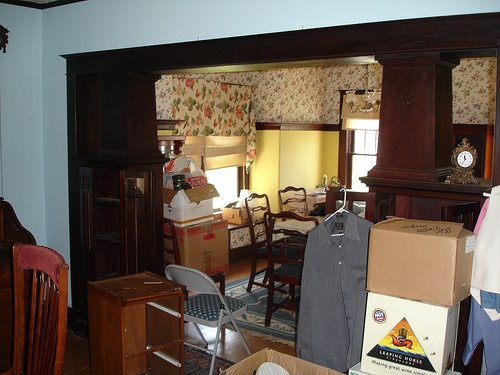

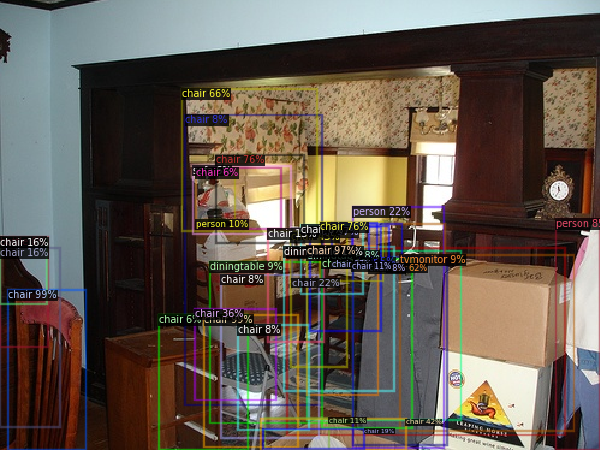

In [12]:
from google.colab.patches import cv2_imshow

im = cv2.imread('/content/datasets/VOC2007/JPEGImages/000005.jpg')
cv2_imshow(im)

predictor = DefaultPredictor(cfg)
outputs = predictor(im)
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

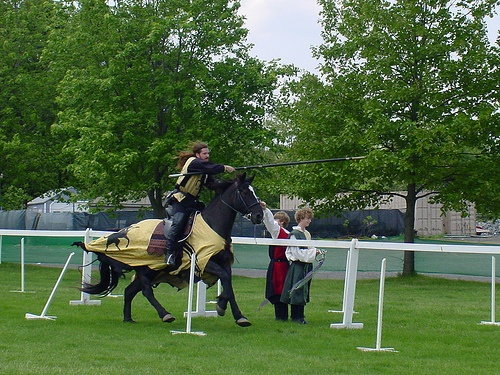

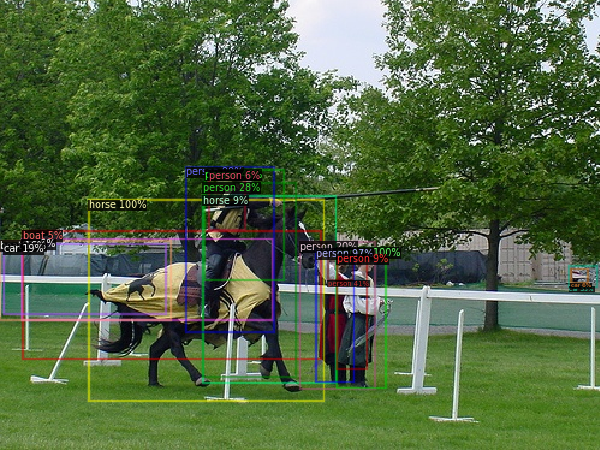

In [13]:
im = cv2.imread('/content/datasets/VOC2007/JPEGImages/000009.jpg')
cv2_imshow(im)

predictor = DefaultPredictor(cfg)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

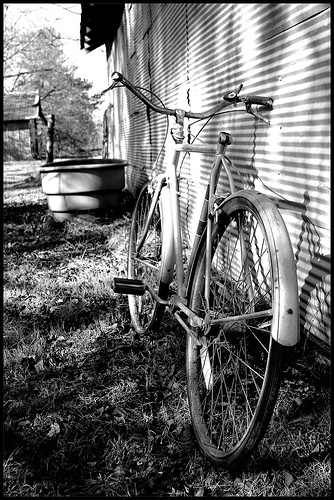

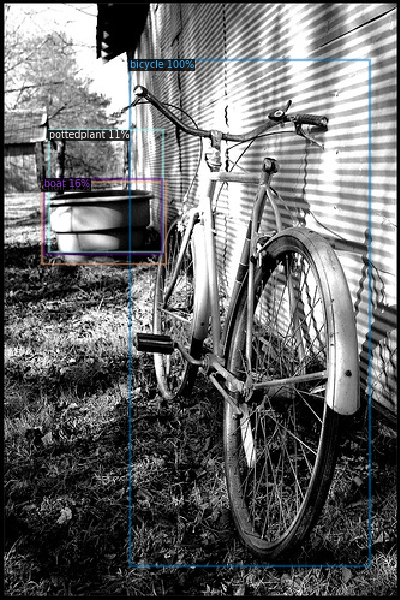

In [14]:
im = cv2.imread('/content/datasets/VOC2007/JPEGImages/000016.jpg')
cv2_imshow(im)

predictor = DefaultPredictor(cfg)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [15]:
from detectron2.evaluation import inference_on_dataset, PascalVOCDetectionEvaluator
from detectron2.data import build_detection_test_loader

dsname = 'voc_2007_train'
evaluator = PascalVOCDetectionEvaluator(dsname)
data_loader = build_detection_test_loader(cfg, dsname)
predictor = DefaultPredictor(cfg)
inference_on_dataset(predictor.model, data_loader, evaluator)

[11/20 19:36:34 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/20 19:36:34 d2.data.common]: Serializing 2501 elements to byte tensors and concatenating them all ...
[11/20 19:36:34 d2.data.common]: Serialized dataset takes 1.14 MiB
[11/20 19:36:35 d2.evaluation.evaluator]: Start inference on 2501 images
[11/20 19:36:36 d2.evaluation.evaluator]: Inference done 11/2501. 0.0749 s / img. ETA=0:03:10
[11/20 19:36:41 d2.evaluation.evaluator]: Inference done 71/2501. 0.0814 s / img. ETA=0:03:22
[11/20 19:36:46 d2.evaluation.evaluator]: Inference done 128/2501. 0.0841 s / img. ETA=0:03:23
[11/20 19:36:51 d2.evaluation.evaluator]: Inference done 184/2501. 0.0853 s / img. ETA=0:03:21
[11/20 19:36:57 d2.evaluation.evaluator]: Inference done 240/2501. 0.0862 s / img. ETA=0:03:19
[11/20 19:37:02 d2.evaluation.evaluator]: Inference done 299/2501. 0.0857 s / img. ETA=0:03:12
[11/20 

OrderedDict([('bbox',
              {'AP': 62.8750528187559,
               'AP50': 88.4459165852376,
               'AP75': 72.42720877949827})])